# 1.3 Amazing International Airlines Inc
## Data Mining Project
------
**Group 12:**

- Luis Mendes 20221949
- Margarida Mourives 20221809
- Simon Sazonov 20221689 
- Veronica Mendes 20221945

----
# Geographic EDA
## Summary

Analyze the geographic distribution of customers behavior.

<a class="anchor" id='toc'></a> 
<div class="alert alert-block alert-info">

## **Index**<br>

[**Geografical EDA**](#1st-bullet)<br>
- [**Conclusions**](#2nd-bullet)<br>

    
</div>

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

sns.set_context("notebook")
sns.set_style("ticks")

import geopandas as gpd
from shapely.geometry import Point

In [28]:
df_AIAI_Master_Complete = pd.read_csv('../../data/DM_AIAI_MasterCustomerDB.csv', index_col=0)
df_AIAI_Master = df_AIAI_Master_Complete.copy()

df_AIAI_Master.head()

,First Name,Last Name,Customer Name,Province or State,City,Latitude,Longitude,Postal code,Gender,Education,Location Code,Income,Marital Status,LoyaltyStatus,EnrollmentDateOpening,CancellationDate,Customer Lifetime Value,EnrollmentType,Re_engaged_people,Days_with_us,Days_until_reengagement,Total_NumFlights,Total_DistanceKM,Perc_Flights_With_Companions,Dollar_Cost_Points_Remaining,Recency_Days,Total_NumFlights_2019,Total_NumFlights_2020,Total_NumFlights_2021,Total_DistanceKM_2019,Total_DistanceKM_2020,Total_DistanceKM_2021,Perc_Flights_With_Companions_2019,Perc_Flights_With_Companions_2020,Perc_Flights_With_Companions_2021,Dollar_Cost_Points_Remaining_2019,Dollar_Cost_Points_Remaining_2020,Dollar_Cost_Points_Remaining_2021,Total_NumFlights_month_1,Total_NumFlights_month_2,Total_NumFlights_month_3,Total_NumFlights_month_4,Total_NumFlights_month_5,Total_NumFlights_month_6,Total_NumFlights_month_7,Total_NumFlights_month_8,Total_NumFlights_month_9,Total_NumFlights_month_10,Total_NumFlights_month_11,Total_NumFlights_month_12,Total_DistanceKM_month_1,Total_DistanceKM_month_2,Total_DistanceKM_month_3,Total_DistanceKM_month_4,Total_DistanceKM_month_5,Total_DistanceKM_month_6,Total_DistanceKM_month_7,Total_DistanceKM_month_8,Total_DistanceKM_month_9,Total_DistanceKM_month_10,Total_DistanceKM_month_11,Total_DistanceKM_month_12,Perc_Flights_With_Companions_month_1,Perc_Flights_With_Companions_month_2,Perc_Flights_With_Companions_month_3,Perc_Flights_With_Companions_month_4,Perc_Flights_With_Companions_month_5,Perc_Flights_With_Companions_month_6,Perc_Flights_With_Companions_month_7,Perc_Flights_With_Companions_month_8,Perc_Flights_With_Companions_month_9,Perc_Flights_With_Companions_month_10,Perc_Flights_With_Companions_month_11,Perc_Flights_With_Companions_month_12,Dollar_Cost_Points_Remaining_month_1,Dollar_Cost_Points_Remaining_month_2,Dollar_Cost_Points_Remaining_month_3,Dollar_Cost_Points_Remaining_month_4,Dollar_Cost_Points_Remaining_month_5,Dollar_Cost_Points_Remaining_month_6,Dollar_Cost_Points_Remaining_month_7,Dollar_Cost_Points_Remaining_month_8,Dollar_Cost_Points_Remaining_month_9,Dollar_Cost_Points_Remaining_month_10,Dollar_Cost_Points_Remaining_month_11,Dollar_Cost_Points_Remaining_month_12
Loyalty#,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
480934,Cecilia,Householder,Cecilia Householder,Ontario,Toronto,43.653225,-79.383186,M2Z 4K1,female,Bachelor,Urban,70146.0,Married,Star,2019-02-15,NaN,3839.14,Standard,False,1049,NaN,191.0,497375.0,29.319372,362.1394,29.0,59.0,64.0,68.0,116079.0,128976.0,252320.0,28.813559,29.687500,29.411765,94.4694,104.95,162.72,2.0,8.0,2.0,13.0,32.0,24.0,30.0,31.0,17.0,8.0,15.0,9.0,25173.0,65501.0,12324.0,4840.0,69191.0,43891.0,49709.0,44944.0,44545.0,70952.0,21244.0,45061.0,0.000000,25.000000,100.000000,23.076923,31.250000,0.000000,0.0,35.483871,58.823529,50.000000,73.333333,33.333333,25.1700,65.4939,12.3200,4.8400,69.1890,43.8785,49.7040,44.9366,44.5399,33.8046,-24.3761,-7.3610
549612,Dayle,Menez,Dayle Menez,Alberta,Edmonton,53.544388,-113.490930,T3G 6Y6,male,College,Rural,0.0,Divorced,Star,2019-03-09,NaN,3839.61,Standard,False,1027,NaN,279.0,389939.0,11.469534,165.2639,29.0,89.0,99.0,91.0,127972.0,142191.0,119776.0,7.865169,8.080808,18.681319,67.8339,75.33,22.10,24.0,17.0,32.0,10.0,42.0,12.0,36.0,36.0,10.0,28.0,21.0,11.0,26197.0,26125.0,28793.0,9958.0,58007.0,3077.0,39929.0,76785.0,24325.0,33704.0,35889.0,27150.0,25.000000,0.000000,0.000000,30.000000,0.000000,41.666667,25.0,25.000000,0.000000,0.000000,0.000000,0.000000,-0.6498,26.1250,28.7843,9.9500,57.9989,3.0700,-157.8262,76.7735,24.3200,33.6881,35.8801,27.1500
429460,Necole,Hannon,Necole Hannon,British Columbia,Vancouver,49.282730,-123.120740,V6E 3D9,male,College,Urban,0.0,Single,Star,2017-07-14,2021-01-08,3839.75,Standard,False,1274,NaN,120.0,229821.0,33.333333,174.9763,363.0,54.0,60.0,6.0,97691.0,108547.0,23583.0,35.185185,35.000000,0.000000,71.7363,79.66,23.58,21.0,8.0,15.0,0.0,23.0,0.0,0.0,21.0,15.0,0

<a class="anchor" id="1st-bullet">    </a>
## Geografical EDA
[Back to Index](#toc)


In [29]:
df_AIAI_Master[['Province or State', 'City', 'Latitude', 'Longitude', 'Postal code', 'Location Code']].nunique()

Province or State    11
City                 29
Latitude             29
Longitude            29
Postal code          55
Location Code         3
dtype: int64

In [30]:
len(df_AIAI_Master.groupby(['Longitude', 'Latitude']))

29

In [31]:
variables_geoanalysis = ['Province or State', 'City', 'Income', 'Customer Lifetime Value',
       'EnrollmentType', 'Re_engaged_people', 'Days_with_us',
       'Days_until_reengagement', 'Total_NumFlights', 'Total_DistanceKM',
       'Perc_Flights_With_Companions', 'Dollar_Cost_Points_Remaining',
       'Recency_Days']

In [32]:

# Convert to GeoDataFrame
GeoDf_AIAI_Geo_Customer = gpd.GeoDataFrame(
    df_AIAI_Master[variables_geoanalysis],
    geometry=gpd.points_from_xy(df_AIAI_Master.Longitude, df_AIAI_Master.Latitude),
    crs="EPSG:4326"  # WGS84 coordinate reference system (lat/lon)
)

In [33]:
# We estimate to see if we could use the same than the one that we previously found
GeoDf_AIAI_Geo_Customer.estimate_utm_crs()

<Projected CRS: EPSG:32615>
Name: WGS 84 / UTM zone 15N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 96°W and 90°W, northern hemisphere between equator and 84°N, onshore and offshore. Canada - Manitoba; Nunavut; Ontario. Ecuador -Galapagos. Guatemala. Mexico. United States (USA).
- bounds: (-96.0, 0.0, -90.0, 84.0)
Coordinate Operation:
- name: UTM zone 15N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [34]:
GeoDf_AIAI_Geo_Customer.to_crs(32615, inplace =True)

In [35]:
GeoDf_AIAI_Geo_Customer.crs

<Projected CRS: EPSG:32615>
Name: WGS 84 / UTM zone 15N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 96°W and 90°W, northern hemisphere between equator and 84°N, onshore and offshore. Canada - Manitoba; Nunavut; Ontario. Ecuador -Galapagos. Guatemala. Mexico. United States (USA).
- bounds: (-96.0, 0.0, -90.0, 84.0)
Coordinate Operation:
- name: UTM zone 15N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [36]:
GeoDf_AIAI_Geo_Customer.head()

,Province or State,City,Income,Customer Lifetime Value,EnrollmentType,Re_engaged_people,Days_with_us,Days_until_reengagement,Total_NumFlights,Total_DistanceKM,Perc_Flights_With_Companions,Dollar_Cost_Points_Remaining,Recency_Days,geometry
Loyalty#,,,,,,,,,,,,,,
480934,Ontario,Toronto,70146.0,3839.14,Standard,False,1049,NaN,191.0,497375.0,29.319372,362.1394,29.0,POINT (1598472.371 4924344.885)
549612,Alberta,Edmonton,0.0,3839.61,Standard,False,1027,NaN,279.0,389939.0,11.469534,165.2639,29.0,POINT (-848735.265 6130411.995)
429460,British Columbia,Vancouver,0.0,3839.75,Standard,False,1274,NaN,120.0,229821.0,33.333333,174.9763,363.0,POINT (-1671065.962 5910698.686)
608370,Ontario,Toronto,0.0,3839.75,Standard,False,2143,NaN,196.0,386030.0,29.591837,222.6413,29.0,POINT (1598472.371 4924344.885)
530508,Quebec,Hull,97832.0,3842.79,2021 Promotion,False,1527,NaN,171.0,366613.0,36.842105,366.5400,29.0,POINT (1851686.681 5178071.192)


In [37]:
data = {
    "Airport": [
        "Toronto Pearson International Airport (YYZ)",
        "Vancouver International Airport (YVR)",
        "Montréal–Trudeau International Airport (YUL)",
        "Calgary International Airport (YYC)",
        "Edmonton International Airport (YEG)",
        "Ottawa Macdonald–Cartier International Airport (YOW)",
        "Winnipeg James Armstrong Richardson International Airport (YWG)",
        "Halifax Stanfield International Airport (YHZ)",
        "Kelowna International Airport (YLW)",
        "Victoria International Airport (YYJ)"
    ],
    "Latitude": [43.6777, 49.1967, 45.4706, 51.1139, 53.3097, 45.3225, 49.9097, 44.8844, 49.9572, 48.6472],
    "Longitude": [-79.6248, -123.1815, -73.7408, -114.0203, -113.5797, -75.6692, -97.2344, -63.5133, -119.3778, -123.4258],
    "Popularity": [90, 100, 70, 40, 50, 60, 30, 80, 10, 20]
}

df = pd.DataFrame(data)
geometry = [Point(lon, lat) for lon, lat in zip(df["Longitude"], df["Latitude"])]
gdf = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")

# -------------------------
# 2. Project to meters CRS
# -------------------------
gdf_m = gdf.to_crs(epsg=3347)  # Canada Lambert Conformal Conic projection

# -------------------------
# 3. Create buffers of same radius (e.g., 100 km)
# -------------------------
buffer_radius_m = 100_000  # 100 km
gdf_m["Buffer"] = gdf_m.buffer(buffer_radius_m)

# -------------------------
# 4. Convert back to lat/lon for Folium
# -------------------------
gdf_buffered = gpd.GeoDataFrame(
    gdf_m.drop(columns="geometry"),
    geometry=gdf_m["Buffer"].to_crs(epsg=4326),
    crs="EPSG:4326"
)

# -------------------------
# 5. Visualize with .explore()
# -------------------------
airport_map = gdf_buffered.explore(
    column="Popularity",       # color by popularity
    cmap="autumn",             # yellow-red colormap
    tooltip=["Airport", "Popularity"],
    legend=True,
    style_kwds={"fillOpacity": 0.4, "weight": 1},
    name="Airport Influence Zones",
    tiles = "Esri.WorldGrayCanvas"
)

airport_map

In [38]:
gdf_buffered_1 = gdf_buffered.copy()

airport_map_1 = gdf_buffered.explore(
    column="Popularity",       # color by popularity
    cmap="autumn",             # yellow-red colormap
    tooltip=["Airport", "Popularity"],
    legend=True,
    style_kwds={"fillOpacity": 0.4, "weight": 1},
    name="Airport Influence Zones",
    tiles = "Esri.WorldGrayCanvas"
)

GeoDf_AIAI_Geo_Customer.explore(m=airport_map_1,
    color="Black",                
    tooltip=['City', 'Province or State'],
    name="Customer Locations")

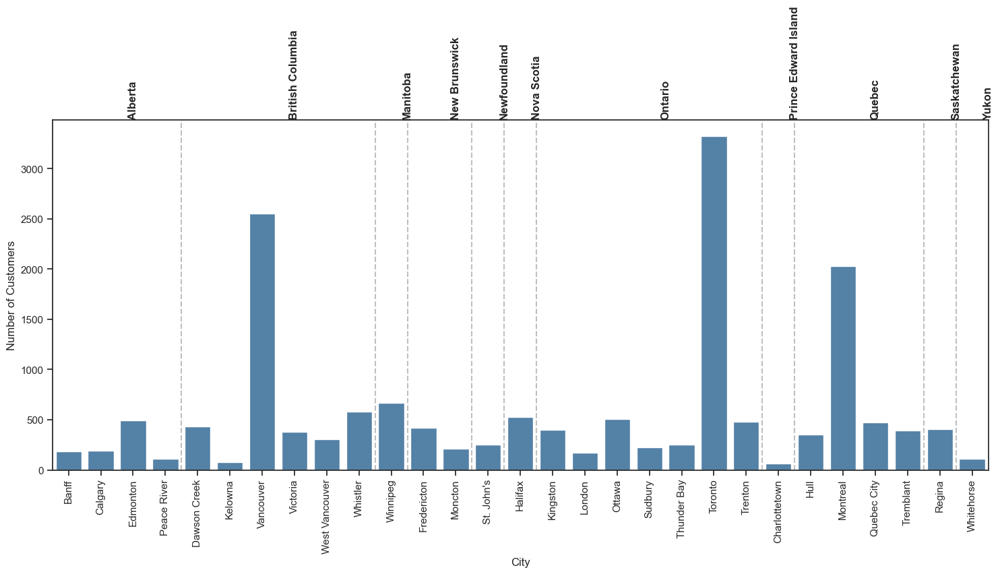

In [39]:
# Get the counts without sorting
location_counts = (df_AIAI_Master.groupby(['Province or State', 'City'])
                  .size()
                  .reset_index(name='Count'))

# Create the plot with larger figure size for better readability
plt.figure(figsize=(15, 8))

# Create nested bar chart
ax = sns.barplot(data=location_counts, 
                 x='City', 
                 y='Count',
                 color='steelblue')

# Customize x-axis labels
plt.xticks(range(len(location_counts)), 
           location_counts['City'], 
           rotation=90, 
           ha='center')

# Add province labels
provinces = location_counts['Province or State'].unique()
current_pos = 0

for province in provinces:
    province_cities = location_counts[location_counts['Province or State'] == province]
    middle_pos = current_pos + len(province_cities)/2
    plt.axvline(x=current_pos-0.5, color='gray', linestyle='--', alpha=0.5)
    
    # Add rotated province labels
    plt.text(middle_pos, plt.ylim()[1], province, 
             ha='center', va='bottom', fontsize=12, fontweight='bold',
             rotation=90)
    current_pos += len(province_cities)

# Customize the plot
plt.xlabel('City', fontsize=12)
plt.ylabel('Number of Customers', fontsize=12)

# Increase margins to accommodate rotated labels
plt.tight_layout()
plt.subplots_adjust(bottom=0.2, top=0.85)

plt.show()

In [40]:
gdf_counts = gpd.GeoDataFrame(
    location_counts,
    geometry=gpd.points_from_xy(
        df_AIAI_Master.groupby('City')['Longitude'].first(),
        df_AIAI_Master.groupby('City')['Latitude'].first()
    ),
    crs="EPSG:4326"
)

# Radius proportional to sqrt(count) (area ~ count)
scale_factor = 0.025  # tweak this to change overall bubble sizes
gdf_counts['radius_m'] = scale_factor * np.sqrt(gdf_counts['Count'])

# Build polygon buffers (using the radius in meters)
gdf_counts['geometry'] = gdf_counts.buffer(gdf_counts['radius_m'])

gdf_counts.rename(columns= {'Count': 'Number of Customers'}, inplace=True)

# Visualize with .explore() — polygon sizes reflect number of customers
count_customers = gdf_counts.explore(
    column='Number of Customers',
    tooltip=['City', 'Province or State', 'Number of Customers'],
    legend=True,
    cmap='autumn',
    style_kwds={'fillOpacity': 0.6, 'weight': 0.8},
    tiles="Esri.WorldGrayCanvas",
    name='Customers by City'
)

count_customers

In [41]:
gdf.explore(m = count_customers,
    column='Popularity',
    tooltip=['Airport', 'Popularity'],
    legend=True,
    cmap='summer',
    tiles="Esri.WorldGrayCanvas"
)

In [42]:
# Dissolve points to one geometry per city
gdf_city_new = GeoDf_AIAI_Geo_Customer.dissolve(by='City', as_index=False)

# Define the new variables for analysis
variables_geoanalysis_new = ['Income',
    'Customer Lifetime Value', 'Re_engaged_people', 
    'Days_with_us', 'Days_until_reengagement', 'Total_NumFlights', 
    'Total_DistanceKM', 'Perc_Flights_With_Companions', 
    'Dollar_Cost_Points_Remaining', 'Recency_Days'
]

# Compute mean for the current variable per city
mean_variable_city = gdf_city_new.groupby('City').agg({'Income': 'mean',
    'Customer Lifetime Value':'mean', 'Re_engaged_people':'mean', 
    'Days_with_us':'mean', 'Days_until_reengagement':'mean', 'Total_NumFlights':'mean', 
    'Total_DistanceKM':'mean', 'Perc_Flights_With_Companions':'mean', 
    'Dollar_Cost_Points_Remaining':'mean', 'Recency_Days':'mean'}).reset_index()

# Merge numeric variable into city geometries
gdf_city_new = gdf_city_new.merge(mean_variable_city, on='City', suffixes=('', '_mean'))

tooltip_list = ['City', 'Province or State', 'Income_mean', 
    'Customer Lifetime Value_mean', 
    'Days_with_us_mean', 'Days_until_reengagement_mean', 'Total_NumFlights_mean', 
    'Total_DistanceKM_mean', 'Perc_Flights_With_Companions_mean', 
    'Dollar_Cost_Points_Remaining_mean', 'Recency_Days_mean'
]

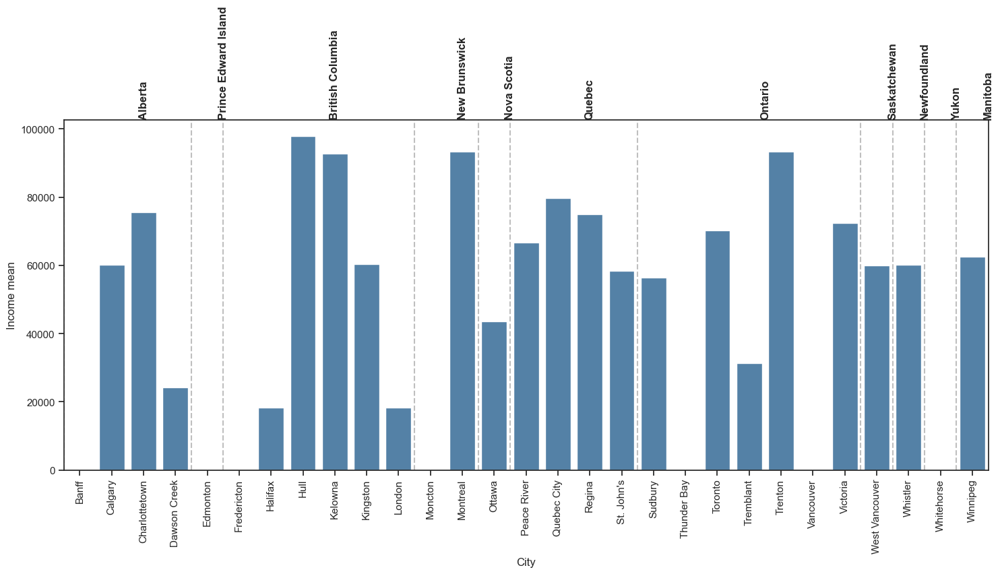

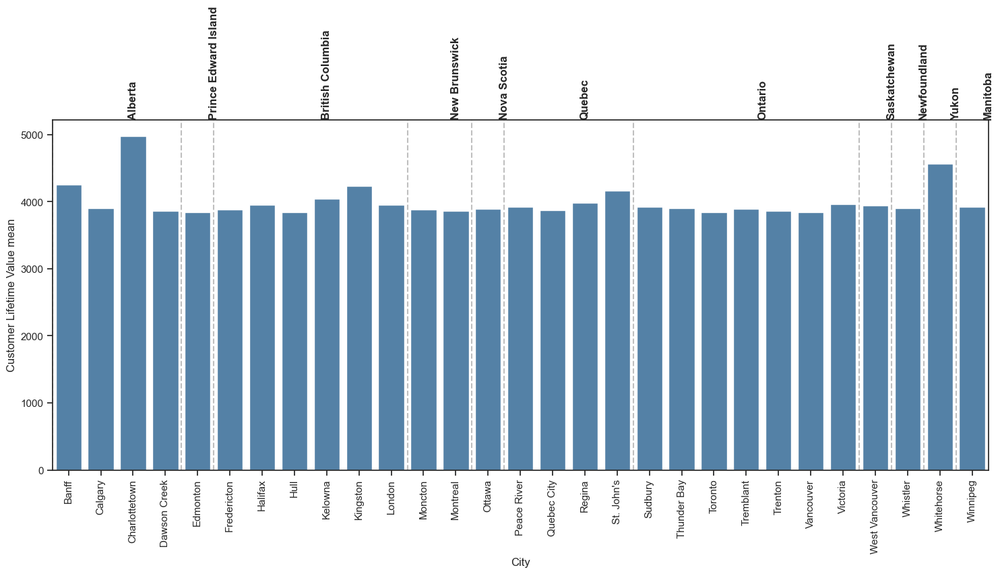

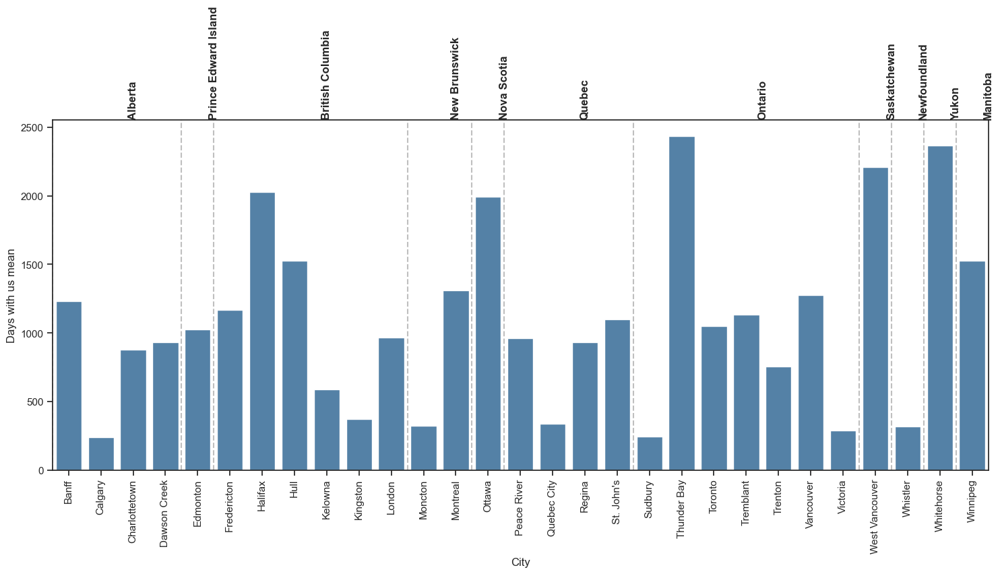

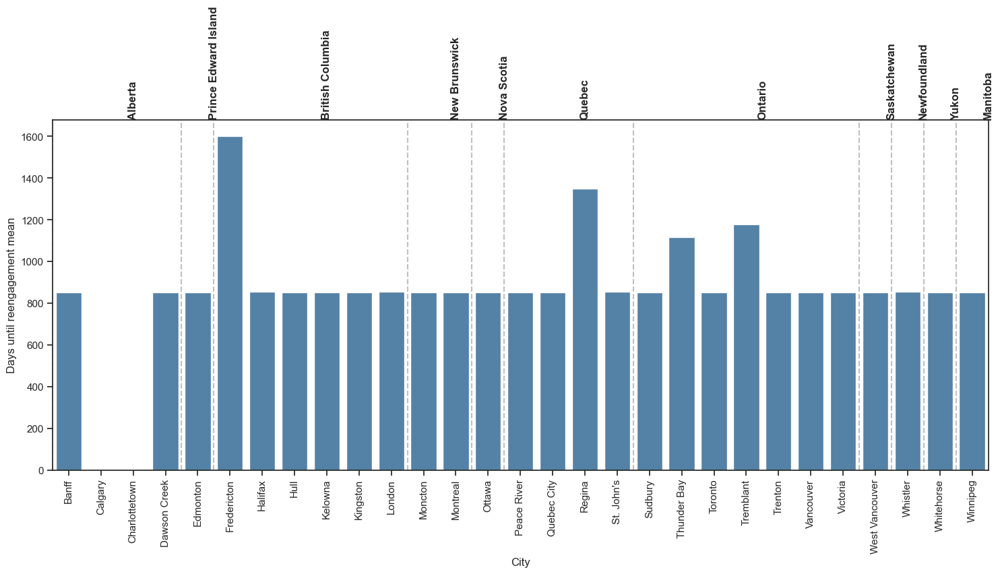

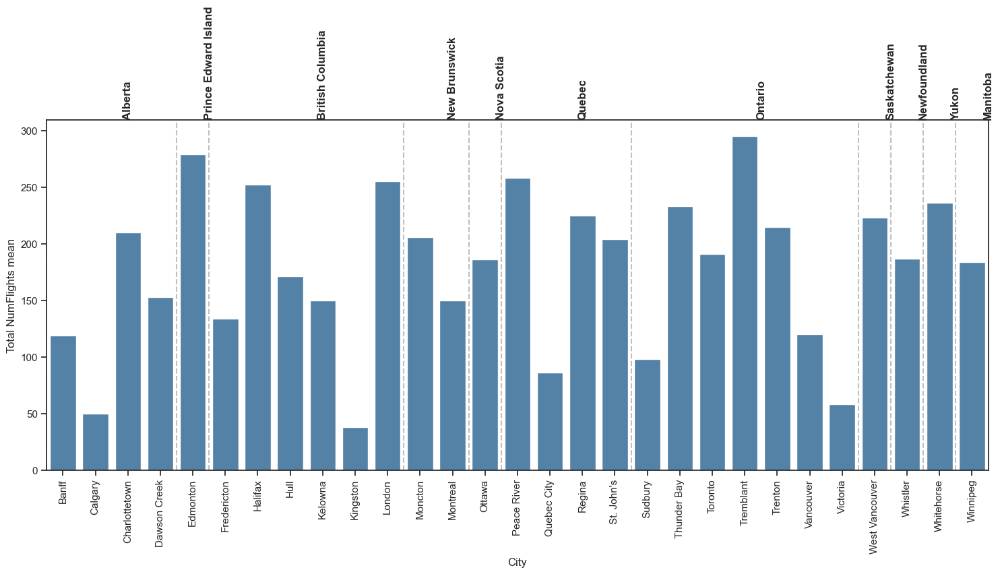

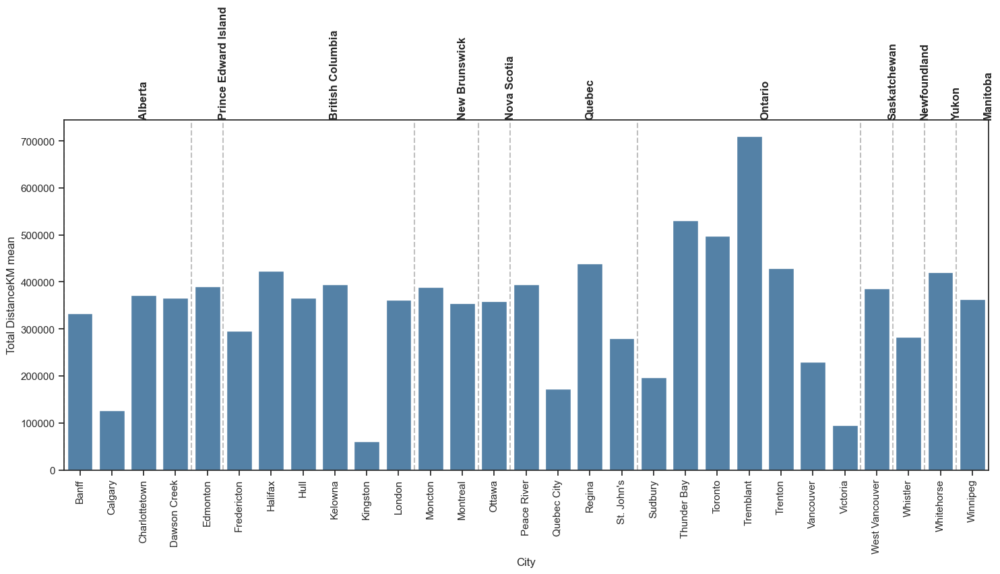

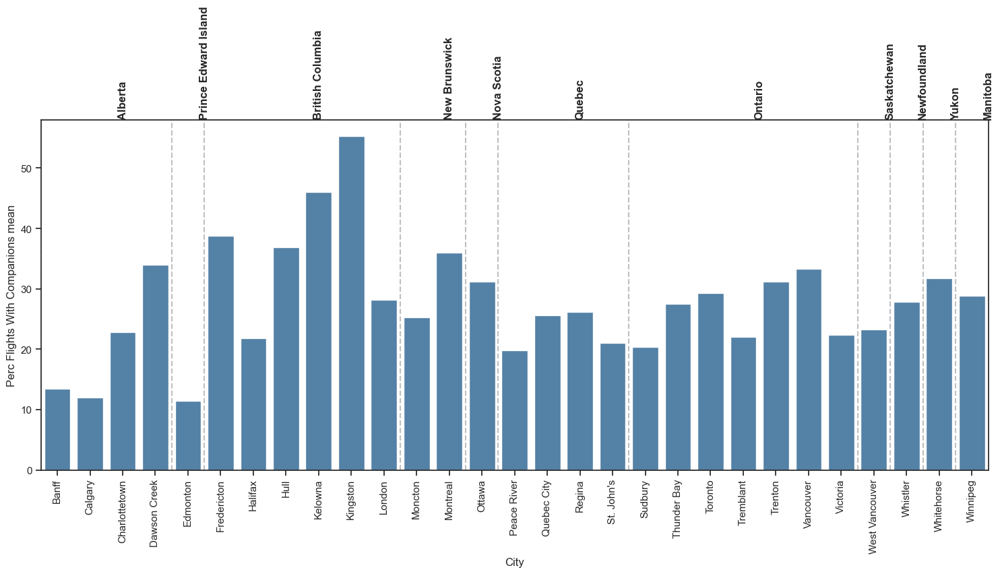

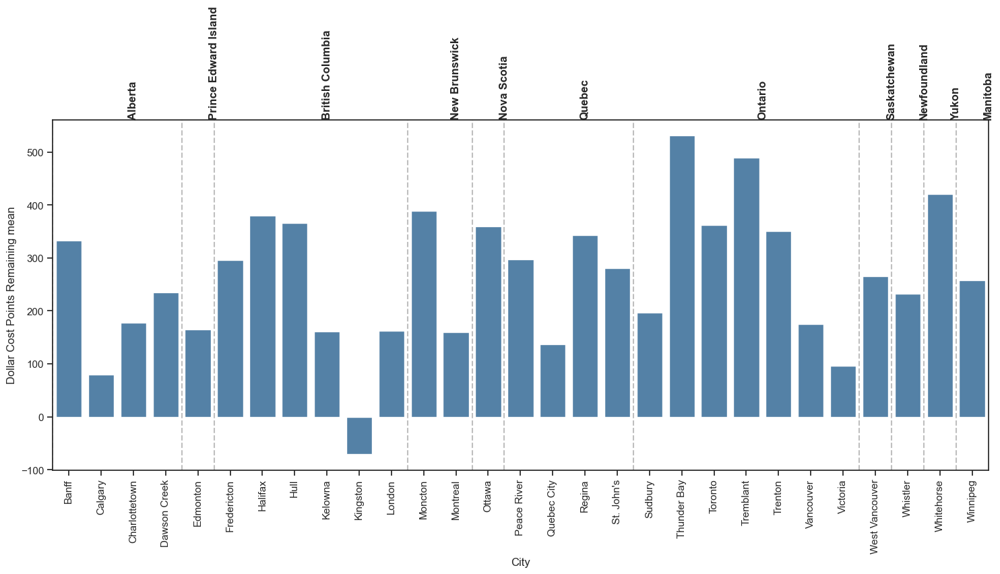

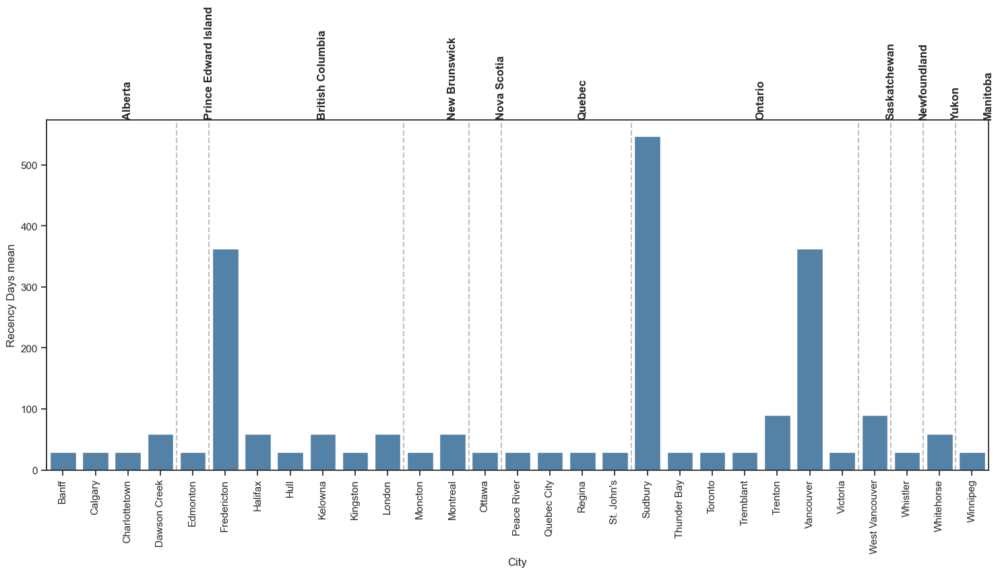

In [43]:
# Define metrics to plot
metrics = ['Income_mean', 'Customer Lifetime Value_mean', 'Days_with_us_mean',
           'Days_until_reengagement_mean', 'Total_NumFlights_mean', 
           'Total_DistanceKM_mean', 'Perc_Flights_With_Companions_mean',
           'Dollar_Cost_Points_Remaining_mean', 'Recency_Days_mean']

# Create one plot for each metric
for metric in metrics:
    # Create the plot with larger figure size for better readability
    plt.figure(figsize=(15, 8))
    
    # Create nested bar chart
    ax = sns.barplot(data=gdf_city_new, 
                     x='City', 
                     y=metric,
                     color='steelblue')
    
    # Customize x-axis labels
    plt.xticks(range(len(gdf_city_new)), 
               gdf_city_new['City'], 
               rotation=90, 
               ha='center')
    
    # Add province labels
    provinces = gdf_city_new['Province or State'].unique()
    current_pos = 0
    
    for province in provinces:
        province_cities = gdf_city_new[gdf_city_new['Province or State'] == province]
        middle_pos = current_pos + len(province_cities)/2
        plt.axvline(x=current_pos-0.5, color='gray', linestyle='--', alpha=0.5)
        
        # Add rotated province labels
        plt.text(middle_pos, plt.ylim()[1], province, 
                 ha='center', va='bottom', fontsize=12, fontweight='bold',
                 rotation=90)
        current_pos += len(province_cities)
    
    # Customize the plot
    plt.xlabel('City', fontsize=12)
    plt.ylabel(metric.replace('_', ' '), fontsize=12)
    
    # Increase margins to accommodate rotated labels
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.2, top=0.85)
    
    plt.show()

In [44]:
gdf_buffered_2 = gdf_buffered.copy()

airport_map_2 = gdf_buffered.explore(
    column="Popularity",       # color by popularity
    cmap="autumn",             # yellow-red colormap
    tooltip=["Airport", "Popularity"],
    legend=True,
    style_kwds={"fillOpacity": 0.4, "weight": 1},
    name="Airport Influence Zones",
    tiles = "Esri.WorldGrayCanvas"
)

# Overlay numeric variable with customized tooltip
gdf_city_new.explore(
    m=airport_map_2,
    column=f'Income_mean',  # numeric variable to color
    cmap='summer',               # sequential colormap
    legend=True,
    tooltip=tooltip_list  
)

In [45]:
gdf_buffered_3 = gdf_buffered.copy()

airport_map_3 = gdf_buffered.explore(
    column="Popularity",       # color by popularity
    cmap="autumn",             # yellow-red colormap
    tooltip=["Airport", "Popularity"],
    legend=True,
    style_kwds={"fillOpacity": 0.4, "weight": 1},
    name="Airport Influence Zones",
    tiles = "Esri.WorldGrayCanvas"
)

# Overlay numeric variable with customized tooltip
gdf_city_new.explore(
    m=airport_map_3,
    column=f'Customer Lifetime Value_mean',  # numeric variable to color
    cmap='summer',               # sequential colormap
    legend=True,
    tooltip=tooltip_list  
)

In [46]:
gdf_buffered_4 = gdf_buffered.copy()

airport_map_4 = gdf_buffered.explore(
    column="Popularity",       # color by popularity
    cmap="autumn",             # yellow-red colormap
    tooltip=["Airport", "Popularity"],
    legend=True,
    style_kwds={"fillOpacity": 0.4, "weight": 1},
    name="Airport Influence Zones",
    tiles = "Esri.WorldGrayCanvas"
)

# Overlay numeric variable with customized tooltip
gdf_city_new.explore(
    m=airport_map_4,
    column=f'Days_with_us_mean',  # numeric variable to color
    cmap='summer',               # sequential colormap
    legend=True,
    tooltip=tooltip_list  
)

In [47]:
gdf_buffered_5 = gdf_buffered.copy()

airport_map_5 = gdf_buffered.explore(
    column="Popularity",       # color by popularity
    cmap="autumn",             # yellow-red colormap
    tooltip=["Airport", "Popularity"],
    legend=True,
    style_kwds={"fillOpacity": 0.4, "weight": 1},
    name="Airport Influence Zones",
    tiles = "Esri.WorldGrayCanvas"
)


# Overlay numeric variable with customized tooltip
gdf_city_new.explore(
    m=airport_map_5,
    column=f'Days_until_reengagement_mean',  # numeric variable to color
    cmap='summer',               # sequential colormap
    legend=True,
    tooltip=tooltip_list  
)

In [48]:
gdf_buffered_6 = gdf_buffered.copy()

airport_map_6 = gdf_buffered.explore(
    column="Popularity",       # color by popularity
    cmap="autumn",             # yellow-red colormap
    tooltip=["Airport", "Popularity"],
    legend=True,
    style_kwds={"fillOpacity": 0.4, "weight": 1},
    name="Airport Influence Zones",
    tiles = "Esri.WorldGrayCanvas"
)

# Overlay numeric variable with customized tooltip
gdf_city_new.explore(
    m=airport_map_6,
    column=f'Total_NumFlights_mean',  # numeric variable to color
    cmap='summer',               # sequential colormap
    legend=True,
    tooltip=tooltip_list  
)

In [49]:
gdf_buffered_7 = gdf_buffered.copy()

airport_map_7 = gdf_buffered.explore(
    column="Popularity",       # color by popularity
    cmap="autumn",             # yellow-red colormap
    tooltip=["Airport", "Popularity"],
    legend=True,
    style_kwds={"fillOpacity": 0.4, "weight": 1},
    name="Airport Influence Zones",
    tiles = "Esri.WorldGrayCanvas"
)

# Overlay numeric variable with customized tooltip
gdf_city_new.explore(
    m=airport_map_7,
    column=f'Perc_Flights_With_Companions_mean',  # numeric variable to color
    cmap='summer',               # sequential colormap
    legend=True,
    tooltip=tooltip_list  
)

In [50]:
gdf_buffered_8 = gdf_buffered.copy()

airport_map_8 = gdf_buffered.explore(
    column="Popularity",       # color by popularity
    cmap="autumn",             # yellow-red colormap
    tooltip=["Airport", "Popularity"],
    legend=True,
    style_kwds={"fillOpacity": 0.4, "weight": 1},
    name="Airport Influence Zones",
    tiles = "Esri.WorldGrayCanvas"
)
# Overlay numeric variable with customized tooltip
gdf_city_new.explore(
    m=airport_map_8,
    column=f'Dollar_Cost_Points_Remaining_mean',  # numeric variable to color
    cmap='summer',               # sequential colormap
    legend=True,
    tooltip=tooltip_list  
)

In [51]:
gdf_buffered_9 = gdf_buffered.copy()

airport_map_9 = gdf_buffered.explore(
    column="Popularity",       # color by popularity
    cmap="autumn",             # yellow-red colormap
    tooltip=["Airport", "Popularity"],
    legend=True,
    style_kwds={"fillOpacity": 0.4, "weight": 1},
    name="Airport Influence Zones",
    tiles = "Esri.WorldGrayCanvas"
)

# Overlay numeric variable with customized tooltip
gdf_city_new.explore(
    m=airport_map_9,
    column=f'Recency_Days_mean',  # numeric variable to color
    cmap='summer',               # sequential colormap
    legend=True,
    tooltip=tooltip_list  
)

<a class="anchor" id="2nd-bullet">    </a>
## Conclusions
[Back to Index](#toc)

+ We have information about 11 Provinces/States on Canada, and 29 cities that are the combination of longitude and latitude.
+ All the customers are located on the ‘middle’ of the city, but they have different ‘Location code’ (urban, suburban, rural), so we could identify a customer by seeing the longitude, latitude and location code.
+ The proportion of gender (male/female), education, location code and marital status is almost equal across all cities.
+ Each city has different numbers of customers, being Toronto, Vancouver and Montreal the higher ones with more than 2000 customers approximately, and are near popular airports (something that makes sence).
+ The mean customer lifetime value is uniform across all cities (around 4000), with the exception of 2 cities that are Charlottetown (4900), that is an island and make sense that the persons there travel a lot on planes since is an island, and Whitehorse (4500), that is a very far city to the left, near Alaska. 
+ Almost all cities had someone that re-engaged, except for Calgary and Charlottetown.
+ We plotted the 10 most important international airports (https://www.godigit.com/international-travel-insurance/airports/airports-in-canada), and analyzed the relationships with the variables that we had.
+ Kingston city is the city that uses more points, since they have a negative dollar cost points remaining. And the people that are near a big airport used more points (they have a lower dollar cost points remaining).
+ It seems like they are no longer offering services to Sudbury, Vancouver and Fredericton, since they had not made a transaction within more than 300 days (on average), is important to address that since there is a big airport in Vancouver.
+ The people that fly the most and most distance are near big important airports.
Note on visualizations: Yellow is more, green and red is less (on the color scale).
+ We saw that depending on the city the customers behave different, so Longitude and Latitude will be importand to groups customers.

